In [1]:
%matplotlib inline
import pandas as pd
import numpy as np 
import networkx as nx
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import cosine_similarity


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
# pd.reset_option('display.max_columns')

nodes_df = pd.read_csv('Datasets/Spotify Artist Feature Collaboration Network/nodes.csv')
print(nodes_df.head())

               spotify_id                name  followers  popularity                                             genres                                         chart_hits
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24                     ['nordic house', 'russelater']                                         ['no (3)']
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72             ['christlicher rap', 'german hip hop']  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36                                                 []                                         ['de (1)']
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52  ['dancehall', 'lovers rock', 'modern reggae', ...                               ['at (1)', 'de (1)']
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39  ['classic swedish pop', 'norrbotten indie', 's...                          

In [3]:
edges_df = pd.read_csv('Datasets/Spotify Artist Feature Collaboration Network/edges.csv')
print(edges_df.head())

                     id_0                    id_1
0  76M2Ekj8bG8W7X2nbx2CpF  7sfl4Xt5KmfyDs2T3SVSMK
1  0hk4xVujcyOr6USD95wcWb  7Do8se3ZoaVqUt3woqqSrD
2  38jpuy3yt3QIxQ8Fn1HTeJ  4csQIMQm6vI2A2SCVDuM2z
3  6PvcxssrQ0QaJVaBWHD07l  6UCQYrcJ6wab6gnQ89OJFh
4  2R1QrQqWuw3IjoP5dXRFjt  4mk1ScvOUkuQzzCZpT6bc0


In [4]:
# Load the datasets
nodes_df = pd.read_csv('Datasets/Spotify Artist Feature Collaboration Network/nodes.csv')
edges_df = pd.read_csv('Datasets/Spotify Artist Feature Collaboration Network/edges.csv')

Remove missing artists

In [5]:
# Rename the column from 'id_0' to 'source'
edges_df = edges_df.rename(columns={'id_0': 'source', 'id_1': 'target'})


# Create sets of the spotify_id, source, and target values
spotify_ids = set(nodes_df['spotify_id'])
sources = set(edges_df['source'])
targets = set(edges_df['target'])

# Find the source and target values that don't exist in spotify_ids
missing_sources = sources.difference(spotify_ids)
missing_targets = targets.difference(spotify_ids)

# Print the missing source and target values
print(f"Missing sources: {missing_sources}")
print(f"Missing targets: {missing_targets}")

# Remove the rows where 'source' is in missing_sources or 'target' is in missing_targets
edges_df = edges_df[~edges_df['source'].isin(missing_sources)]
edges_df = edges_df[~edges_df['target'].isin(missing_targets)]
print("Removed missing sources and targets")

Missing sources: {'4N0EUas6rgOC46pdItA4lS', '27ufyazRKnwhqek49AVTFI', '2UoLmuBFuFxk0tNgr30YR8', '0sqDHbUMQqPV9VL6VJaOHn'}
Missing targets: {'5gFvMcdpe2BWR80gm5ydx3', '5La2QKWheJBmTRzRAo5SKp'}
Removed missing sources and targets


Preprocessing features

In [6]:
# Normalize popularity and follower features

# Normalize hit_count values
scaler = MinMaxScaler()

nodes_df["popularity_norm"] = MinMaxScaler().fit_transform(nodes_df[["popularity"]])

nodes_df["log_followers"] = np.log(nodes_df["followers"])
# Replace infinite or large values with a finite value
nodes_df["log_followers"] = nodes_df["log_followers"].replace([np.inf, -np.inf], np.nan)

# Replace NaN values with a finite value
finite_max = nodes_df[nodes_df["log_followers"] != np.inf]["log_followers"].max()
nodes_df["log_followers"] = nodes_df["log_followers"].fillna(finite_max)

# Normalize log_followers feature
nodes_df["log_followers_norm"] = scaler.fit_transform(nodes_df[["log_followers"]])

/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [8]:
# Extract and sum hit_count values
hit_counts = []
for index, row in nodes_df.iterrows():
    chart_hits = eval(row['chart_hits']) if pd.notnull(row['chart_hits']) else []
    hit_count_sum = 0
    if chart_hits:
        for hit in chart_hits:
            _, hit_count = hit.split(' ')
            hit_count = int(hit_count[1:-1])  # Remove the parentheses and convert to int
            hit_count_sum += hit_count
    hit_counts.append(hit_count_sum)

hit_counts_norm = scaler.fit_transform(np.array(hit_counts).reshape(-1, 1))

# Add normalized hit_count as a new column
nodes_df['hit_count_norm'] = hit_counts_norm

nodes_df.head()
# Now you can use 'hit_count_norm' in your calculations

,spotify_id,name,followers,popularity,genres,chart_hits,popularity_norm,log_followers,log_followers_norm,hit_count_norm
0,48WvrUGoijadXXCsGocwM4,Byklubben,1738.0,24,"['nordic house', 'russelater']",['no (3)'],0.24,7.460490,0.404538,0.000599
1,4lDiJcOJ2GLCK6p9q5BgfK,Kontra K,1999676.0,72,"['christlicher rap', 'german hip hop']","['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...",0.72,14.508496,0.786709,0.041758
2,652XIvIBNGg3C0KIGEJWit,Maxim,34596.0,36,[],['de (1)'],0.36,10.451493,0.566722,0.000200
3,3dXC1YPbnQPsfHPVkm1ipj,Christopher Martin,249233.0,52,"['dancehall', 'lovers rock', 'modern reggae', ...","['at (1)', 'de (1)']",0.52,12.426143,0.673795,0.000400
4,74terC9ol9zMo8rfzhSOiG,Jakob Hellman,21193.0,39,"['classic swedish pop', 'norrbotten indie', 's...",['se (6)'],0.39,9.961426,0.540148,0.001199


In [ ]:
# Combine the normalized features into a single feature vector
nodes_df['feature_vector'] = nodes_df[['popularity_norm', 'log_followers_norm', 'hit_count_norm']].values.tolist()

# Create a matrix of feature vectors
# feature_matrix = np.array(nodes_df['feature_vector'].tolist())

# Calculate cosine similarity for each pair of artists
# cosine_similarities = cosine_similarity(feature_matrix)

# Now, cosine_similarities[i][j] gives the cosine similarity between artist i and artist j

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


: 

In [9]:
def visualize_graph(G, color):
    plt.figure(figsize=(20,20))
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), with_labels=False, node_color=color) #, cmap="Set2"
    plt.show()

def visualize_graph(G):
    plt.figure(figsize=(20,20))
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), node_size=10, with_labels=True) #, cmap="Set2"
    plt.show()

In [59]:
# Create a new undirected graph
G = nx.Graph()

# Add nodes to the graph
for index, row in nodes_df.iterrows():
    chart_hits = eval(row['chart_hits']) if pd.notnull(row['chart_hits']) else []
    G.add_node(row['spotify_id'], name=row['name'], chart_hits=chart_hits)


print(G.nodes(data=True))

[('48WvrUGoijadXXCsGocwM4', {'name': 'Byklubben', 'chart_hits': ['no (3)']}), ('4lDiJcOJ2GLCK6p9q5BgfK', {'name': 'Kontra K', 'chart_hits': ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', 'vn (1)']}), ('652XIvIBNGg3C0KIGEJWit', {'name': 'Maxim', 'chart_hits': ['de (1)']}), ('3dXC1YPbnQPsfHPVkm1ipj', {'name': 'Christopher Martin', 'chart_hits': ['at (1)', 'de (1)']}), ('74terC9ol9zMo8rfzhSOiG', {'name': 'Jakob Hellman', 'chart_hits': ['se (6)']}), ('0FQMb3mVrAKlyU4H5mQOJh', {'name': 'Madh', 'chart_hits': ['it (2)']}), ('71BhXa24Zf5zcikUb00l2N', {'name': 'Juice', 'chart_hits': ['se (4)']}), ('3TG1RXLaEhHz5SIPMWahit', {'name': 'Nehuda', 'chart_hits': ['fr (1)']}), ('7MFvm8pwjLdmVBZddGNiQH', {'name': 'VovaZiLvova', 'chart_hits': ['ua (1)']}), ('5I82NM6jN4Y267iHwVeNR9', {'name': 'Nata Record', 'chart_hits': ['do (1)']}), ('5OkJ74jazRprW3kCTjfgOL', {'name': 'Yomi', 'chart_hits': ['no (2)']}), ('6swIRY9NcGlW0PwO5KlqKV', {'name': 'Kauniit & Uhkarohkeat', 'chart_hits': ['fi (2)']}), ('5qBZETtyzfY

In [65]:
# Add edges to the graph
for index, row in edges_df.iterrows():
    source_hits = G.nodes[row['source']]['chart_hits'] if row['source'] in G else []
    target_hits = G.nodes[row['target']]['chart_hits'] if row['target'] in G else []
    
    # print(source_hits)
    # Calculate the weight based on the chart_hits data
    weight = 0
    for hit in source_hits:
        country, hit_count = hit.split(' ')
        hit_count = int(hit_count[1:-1])  # Remove the parentheses and convert to int
        weight += hit_count
    for hit in target_hits:
        country, hit_count = hit.split(' ')
        hit_count = int(hit_count[1:-1])  # Remove the parentheses and convert to int
        weight += hit_count

    G.add_edge(row['source'], row['target'], weight=weight)

In [67]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Adjust the weights based on degree centrality
for u, v, data in G.edges(data=True):
    data['weight'] *= (degree_centrality[u] + degree_centrality[v])

# In case I want to visualize the graph, I can use the following code:
# Get a list of the first 10 nodes
subset_of_nodes = list(G.nodes())[:500]

# Create a subgraph from G using the subset of nodes
H = G.subgraph(subset_of_nodes)

In [40]:
# Visualize the largest connected component of the network 
# Not recommended on the whole network, takes forever, filter artists based on criteria and perform on a smaller subgraph (ex. 100 most popular artists)
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G0 = G.subgraph(Gcc[0])
# c_nodes = []
# for i in Gcc[0]:
#     c_nodes.append(graph.x[i,696].numpy())
# visualize_graph(G0, color = c_nodes)
# visualize_graph(G0)

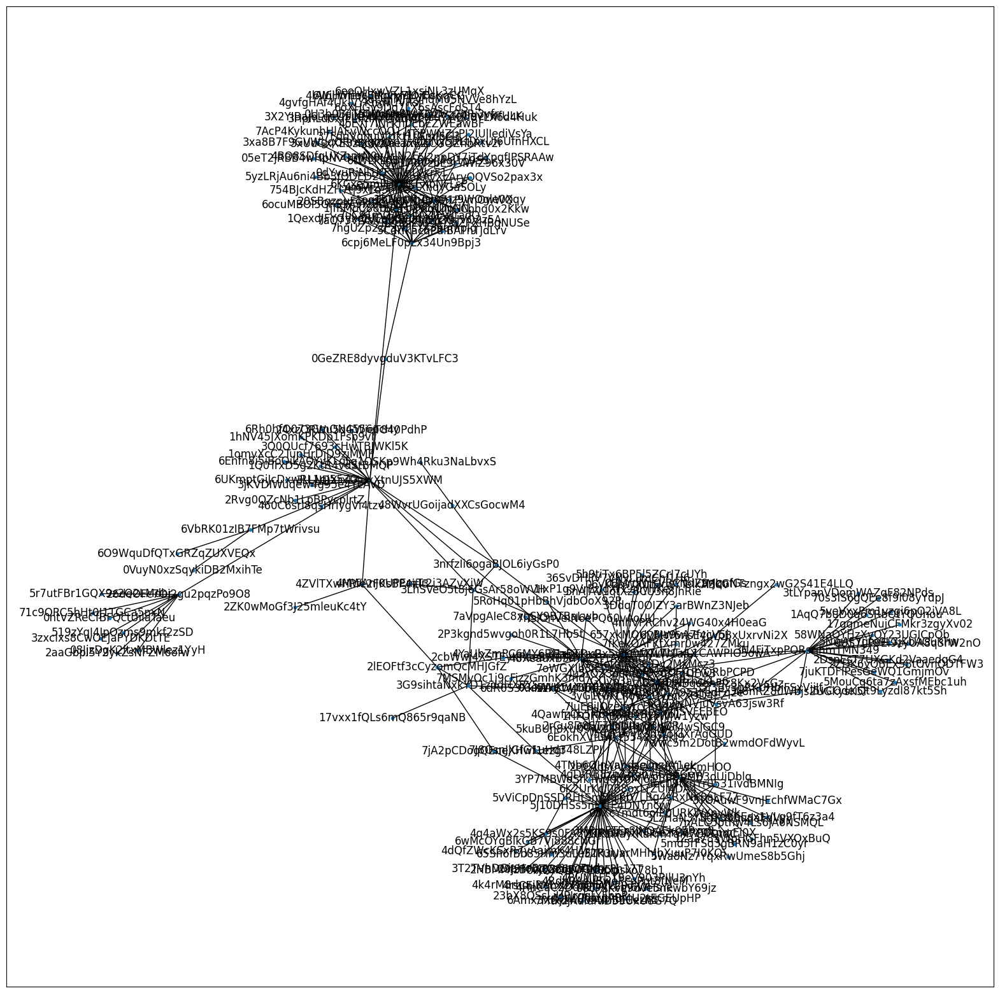

In [41]:
# Get the largest connected component
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G0 = G.subgraph(Gcc[0])

# Get a subgraph of G0 centered at some node within a certain radius
node = list(G0.nodes)[0]  # Use the first node in G0 as the center
radius = 4  # Use a radius of 3
subgraph = nx.ego_graph(G0, node, radius=radius)

# Visualize the subgraph
visualize_graph(subgraph)

In [42]:
# find top 10 nodes with highest degree
# Calculate the degree of each node in the graph
degrees = G.degree()

# Sort the nodes based on their degree in descending order
sorted_nodes = sorted(degrees, key=lambda x: x[1], reverse=True)

# Get the top 10 nodes with the highest degree
top_10_nodes = sorted_nodes[:10]

# Print the top 10 nodes with their degrees
for node, degree in top_10_nodes:
    node_name = G.nodes[node]['name']
    print(f"Node: {node}, Name: {node_name}, Degree: {degree}")

Node: 5aIqB5nVVvmFsvSdExz408, Name: Johann Sebastian Bach, Degree: 1781
Node: 1U5zgr455OGyIkLNXvDdrf, Name: Traditional, Degree: 1371
Node: 0f1IECbrVV952unZkzrsg2, Name: Mc Gw, Degree: 858
Node: 4hV3aU0WKvFaiX5ugXP5hp, Name: MC MN, Degree: 632
Node: 7jzR5qj8vFnSu5JHaXgFEr, Name: Jean Sibelius, Degree: 580
Node: 0SfsnGyD8FpIN4U4WCkBZ5, Name: Armin van Buuren, Degree: 513
Node: 13y7CgLHjMVRMDqxdx0Xdo, Name: Gucci Mane, Degree: 509
Node: 77AiFEVeAVj2ORpC85QVJs, Name: Steve Aoki, Degree: 498
Node: 7hJcb9fa4alzcOq3EaNPoG, Name: Snoop Dogg, Degree: 495
Node: 5fMUXHkw8R8eOP2RNVYEZX, Name: Diplo, Degree: 494


In [46]:
deg = nx.degree_centrality(G)
eigen = nx.eigenvector_centrality(G)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/g4/c8mzjwq92gz1xqmd1brfdz800000gn/T/ipykernel_16997/1503429604.py", line 3, in <module>
    close = nx.closeness_centrality(G)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/utils/backends.py", line 412, in __call__
    return self.orig_func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/algorithms/centrality/closeness.py", line 123, in closeness_centrality
    sp = path_length(G, n)
         ^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/utils/backends.py", line 412, in _

In [47]:
between = nx.betweenness_centrality(G)

KeyboardInterrupt: 

In [48]:

close = nx.closeness_centrality(G)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/g4/c8mzjwq92gz1xqmd1brfdz800000gn/T/ipykernel_16997/3298403816.py", line 1, in <module>
    close = nx.closeness_centrality(G)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/utils/backends.py", line 412, in __call__
    return self.orig_func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/algorithms/centrality/closeness.py", line 123, in closeness_centrality
    sp = path_length(G, n)
         ^^^^^^^^^^^^^^^^^
  File "/Users/aseemkhandelwal/opt/anaconda3/envs/notebook/lib/python3.11/site-packages/networkx/utils/backends.py", line 412, in _

In [ ]:
deg
eigen
close
between


Link Prediction with Jaccard Coefficient

In [11]:
def weighted_jaccard_coefficient(artist_a, artist_b):
    # Get the features for each artist
    features_a = [artist_a['popularity_norm'], artist_a['log_followers_norm'], artist_a['hit_count_norm']]
    features_b = [artist_b['popularity_norm'], artist_b['log_followers_norm'], artist_b['hit_count_norm']]

    # Calculate the weighted sum of features for each artist using the custom formula
    weighted_sum_a = artist_a['log_followers_norm'] + (artist_a['hit_count_norm'] * artist_a['popularity_norm'])
    weighted_sum_b = artist_b['log_followers_norm'] + (artist_b['hit_count_norm'] * artist_b['popularity_norm'])

    # Calculate the intersection and union of the feature sets
    intersection = sum(min(a, b) for a, b in zip(features_a, features_b))
    union = weighted_sum_a + weighted_sum_b - intersection

    # Calculate the weighted Jaccard coefficient
    if union == 0:  # Handle division by zero case
        return 0.0

    return intersection / union

In [12]:
# with Cosine similarity as a weight: compare results with and without cosine similarity

from numpy import dot
from numpy.linalg import norm

def weighted_jaccard_coefficient(artist_a, artist_b):
    # Get the features for each artist
    features_a = [artist_a['popularity_norm'], artist_a['log_followers_norm'], artist_a['hit_count_norm']]
    features_b = [artist_b['popularity_norm'], artist_b['log_followers_norm'], artist_b['hit_count_norm']]

    # Calculate the cosine similarity
    cos_sim = dot(features_a, features_b)/(norm(features_a)*norm(features_b))

    # Calculate the weighted sum of features for each artist using the custom formula
    weighted_sum_a = artist_a['log_followers_norm'] + (artist_a['hit_count_norm'] * artist_a['popularity_norm'])
    weighted_sum_b = artist_b['log_followers_norm'] + (artist_b['hit_count_norm'] * artist_b['popularity_norm'])

    # Calculate the intersection and union of the feature sets
    intersection = sum(min(a, b) for a, b in zip(features_a, features_b))
    union = weighted_sum_a + weighted_sum_b - intersection

    # Calculate the weighted Jaccard coefficient, using the cosine similarity as a weight
    if union == 0:  # Handle division by zero case
        return 0.0

    return cos_sim * (intersection / union)